# "'The Pet" Pet Project

The purpose of this pet project is to get closer to deep learning and make experience on all stages of a neural network creation. The project was inspired by my dog, a Japanese Akita, and all those people who ask if it's a Husky, Shiba ecc. Dog owners are known to be rather precise on the breed of their dogs. I'm not an exception 😇.

Our nearal network shall be able to classify the proposed dog images among Akita inu, Shiba inu and Siberian husky breeds. At the very last moment I added one more class which is "other breeds", which is quite a disputable decision, as any nearal network would be struggling to learn patterns on a huge varieties of other breeds who look completely different. On the other hand, my choice was to prevent the model to try to classify a different dog as one from the mentioned above breeds, which would have been inevitable.
Thus, we will be constructing a model for multiclass classification.

The code below is to create a neural network, able to classify several dog breeds. The idea is to train it on the dogs's images collected through the web. No ready datasets of the selected breeds were discovered and, as a consequence, used for the training. Since the created dataset is rather small, the idea is to create a DL model using the transfer learning technology.
The project steps will include:
* collection of relevant images by breed;
* images check;
* creation of image generators with the relevant preprocessing;
* model construction and fitting;
* model testing;
* result overview.

## Images Check

In [34]:
# importing libraries and dependencies we will be using
import tensorflow as tf
import numpy as np 
from keras.preprocessing.image import ImageDataGenerator 
from PIL import Image 
import os
from keras.models import Sequential
from keras.optimizers import Adam
from keras.applications.xception import Xception
import cv2
import imghdr
import matplotlib.pyplot as plt  
%matplotlib inline
import matplotlib.image as mpimg 
import seaborn as sns
from keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout, GlobalAveragePooling2D
from keras.utils import load_img, img_to_array
from keras.applications.xception import preprocess_input
from keras.callbacks import LearningRateScheduler
from IPython.display import clear_output
from tensorflow import keras
from sklearn.metrics import confusion_matrix
import warnings # импортируем warnings to ignore Jupyter warnings
warnings.simplefilter("ignore")

In [2]:
#  setting GPU Memory Consumption Growth Avoid OOM errors
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus: 
    tf.config.experimental.set_memory_growth(gpu, True)

tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [3]:
data_dir = 'pet_images'

In [4]:
image_exts = ['jpeg', 'bmp', 'png', 'jpg'] # list of acceptable image extensions

In [5]:
# checking collected images by extention and removing the formats we dont't deal with
for image_class in os.listdir(data_dir): 
    for image in os.listdir(os.path.join(data_dir, image_class)):
        image_path = os.path.join(data_dir, image_class, image)
        try: 
            img = cv2.imread(image_path)
            tip = imghdr.what(image_path)
            
            if tip not in image_exts: 
                print('Image {} is not in the extentions list'.format(image_path))
                os.remove(image_path)
        except: 
            print('Issue with image {}'.format(image_path))
            os.remove(image_path)

In [6]:
# checking images for image modes and converting pngs to the proper mode
for image_class in os.listdir(data_dir): 
    for image in os.listdir(os.path.join(data_dir, image_class)):
        image_path = os.path.join(data_dir, image_class, image)
        im = Image.open(image_path)
        if im.format is 'PNG':
            if im.mode is not 'RGBA':
                im.convert("RGBA").save(f"{image}2.png")
                os.remove(image_path)
        

In [7]:
# checking images for image modes and converting pngs to the proper mode
for image_class in os.listdir('test'): 
    for image in os.listdir(os.path.join('test', image_class)):
        image_path = os.path.join('test', image_class, image)
        im = Image.open(image_path)
        if im.format is 'PNG':
            if im.mode is not 'RGBA':
                im.convert("RGBA").save(f"{image}2.png")
                os.remove(image_path)

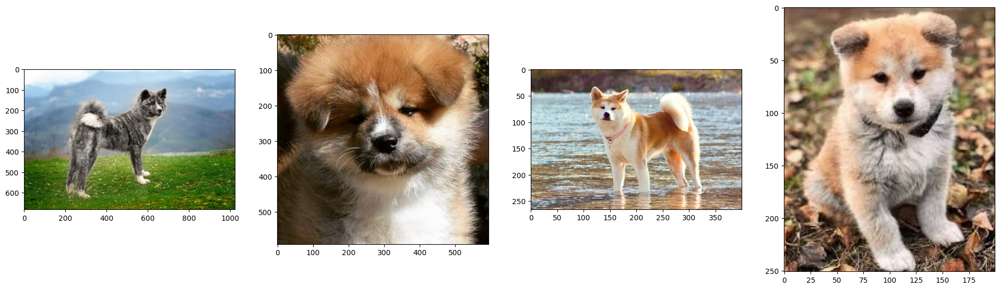

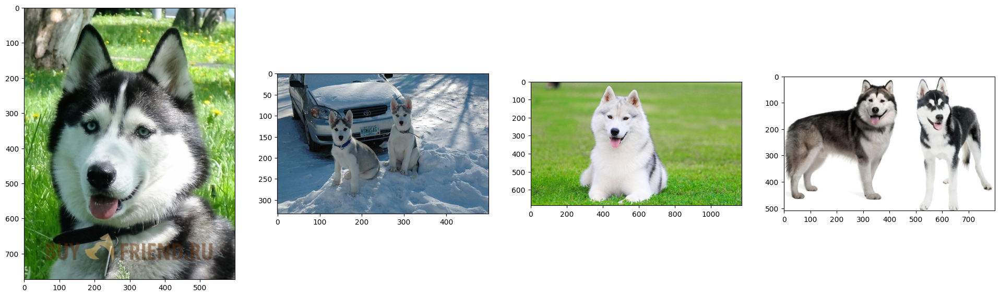

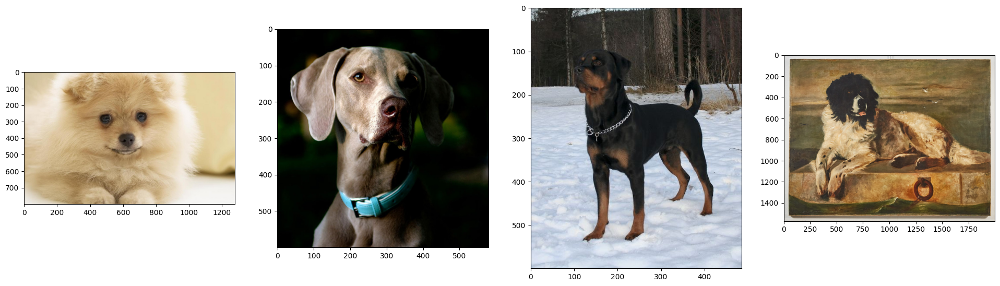

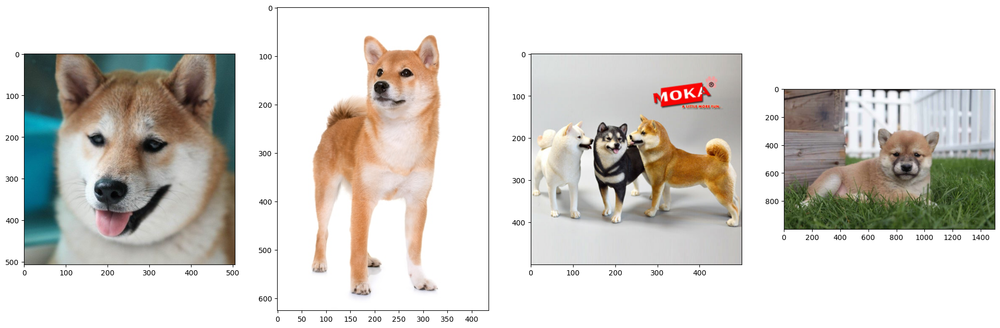

In [33]:
# printing some random imnages of each class
for image_class in os.listdir(data_dir): 
    images = os.listdir(os.path.join(data_dir, image_class)) # list of all the images
    subset_images = np.random.choice(images, size=4, replace=True)
    fig = plt.figure(figsize=(24, 16))
    for i in range(len(subset_images)):
        plt.subplot(1,4, i+1)
        image = Image.open(os.path.join(data_dir, image_class, subset_images[i]))
        array = np.array(image)
        plt.imshow(array)
    plt.show()

As we may notice, "other breed"dogs are very different among themselves. At the same time, dogs of the same breed may differ a lot. For instance, together with the most typical red fawn dogs there are tiger, white and long coat Japanese Akitas. Shiba Inu can be red, black or white. Siberian husky can be black or blue-eyed, there are some red huskies as well. Akitas are a way bigger than Shibas, but thi is not so evident in the pictures. Thus, only colours or dimensions can not be the only patterns for our model. 

## Creation of Image Generators with the Relevant Preprocessing

Since we have test images in a separate folder, we will create 2 image generators (train and validation) from the relative folder, splitting them 4 to 1. Train images will be also augmnenated to improve fitting process. After having been experiencing with more pretrained models, in the end we chose Xcpetion, therefore we will be applying the built-in preprocessing function. Intup size wil be set to standard for Xception size. The best performance was reached with the batch of 16 images.

In [9]:
# creating 2 different image generators for train and validation

train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input,
    validation_split=0.2, rotation_range=90,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True)

validation_datagen = ImageDataGenerator(preprocessing_function=preprocess_input,
    validation_split=0.2)

train_datagen_flow = train_datagen.flow_from_directory(
    data_dir,
    target_size=(299, 299),
    batch_size = 16,
    class_mode='sparse',
    subset='training',
    seed=12345)

val_datagen_flow = validation_datagen.flow_from_directory(
    data_dir,
    target_size=(299, 299),
    batch_size=16,
    class_mode='sparse',
    subset='validation',
    seed=12345) 

Found 4215 images belonging to 4 classes.
Found 1051 images belonging to 4 classes.


In [10]:
train_datagen_flow.class_indices # checking class-label correspondence

{'akita_inu': 0, 'husky': 1, 'other_breed': 2, 'shiba_inu': 3}

In [11]:
val_datagen_flow.class_indices # checking class-label correspondence

{'akita_inu': 0, 'husky': 1, 'other_breed': 2, 'shiba_inu': 3}

In [12]:
# checking number of batches in both generators
print(len(train_datagen_flow))
len(val_datagen_flow)

264


66

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

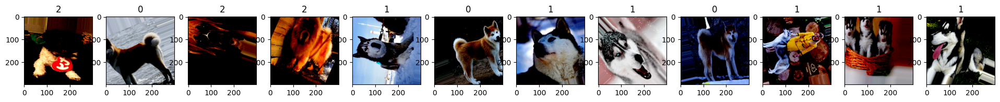

In [13]:
# printing some images of 1 train batch
images, labels = train_datagen_flow.next()
fig, ax = plt.subplots(ncols=12, figsize=(24,4))
for idx, img in enumerate(images[:12]):
    ax[idx].imshow(img)
    ax[idx].title.set_text(int(labels[idx]))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

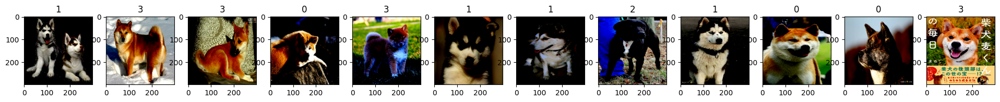

In [14]:
# printing some images of 1 validation batch
images, labels = val_datagen_flow.next()
fig, ax = plt.subplots(ncols=12, figsize=(24,4))
for idx, img in enumerate(images[:12]):
    ax[idx].imshow(img)
    ax[idx].title.set_text(int(labels[idx]))

## Model Creation and Fitting

More models were tested to choose the best, both self-constructed and pretrained ones (Resnet50, MobleNetV2). Nevertheless, the best result was reached through Xception transfer learning. This idea is quite pupular: we will be using the upper part of Xception freezing the top layers and making the upper ones not trainable to keep their original weights. We will also add some customized top layers. The last one will have 4 neurons, since we are classifying among 4 classes and softmax as activation function. The metric we will be following is banally accuracy, because the classes are balanced and it is the most intuitive one for multiclass classification. Optimizer choise is quite standard too - Adam. It will be customazing the learning rate for each parameter.

In [15]:
# definbing a function for model construction
def create_clf():
    optimizer = Adam(learning_rate=0.0001) 
    backbone = Xception(input_shape=(299, 299, 3),
                    weights='imagenet', 
                    include_top=False)
    for layer in backbone.layers:
        layer.trainable=False
    clf = Sequential()
    clf.add(backbone)
    clf.add(GlobalAveragePooling2D())
    clf.add(Dense(224, activation='relu'))
    clf.add(Dropout(0.25))
    clf.add(Dense(4, activation='softmax'))
    clf.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
    return clf


In [16]:
# creating our model and checking the layers/parameters
model = create_clf()
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 xception (Functional)       (None, 10, 10, 2048)      20861480  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 224)               458976    
                                                                 
 dropout (Dropout)           (None, 224)               0         
                                                                 
 dense_1 (Dense)             (None, 4)                 900       
                                                                 
Total params: 21,321,356
Trainable params: 459,876
Non-trainable params: 20,861,480
______________________________________

In [17]:
# creating an ad-hoc callback class for live plotting during the model training
class LivePlotting(keras.callbacks.Callback):

    def on_train_begin(self, logs={}):
        self.metrics = {}
        for metric in logs:
            self.metrics[metric] = []
            

    def on_epoch_end(self, epoch, logs={}):
        for metric in logs:
            if metric in self.metrics:
                self.metrics[metric].append(logs.get(metric))
            else:
                self.metrics[metric] = [logs.get(metric)]
        
   
        metrics = [x for x in logs if 'val' not in x]
        
        f, axs = plt.subplots(1, len(metrics), figsize=(15,5))
        clear_output(wait=True)

        for i, metric in enumerate(metrics):
            axs[i].plot(range(1, epoch + 2), 
                        self.metrics[metric], 
                        label=metric)
            if logs['val_' + metric]:
                axs[i].plot(range(1, epoch + 2), 
                            self.metrics['val_' + metric], 
                            label='val_' + metric)
                
            axs[i].legend()
            axs[i].grid()

        plt.tight_layout()
        plt.show()

We will create 3 callbacks:

    - to plot our training performance (logloss and accuracy curves) live;
    - to log and save locally our training;
    - to vary our learning rate based on the epoch number.

In [18]:
# creating a callback for logging the training and a callback for the learning rate variation

logdir='logs'
callback = tf.keras.callbacks.TensorBoard(log_dir=logdir)

def scheduler(epoch, lr=0.0001):
    if epoch < 21:
        return lr
    else:
        return lr * 0.1
sch = tf.keras.callbacks.LearningRateScheduler(scheduler)

In [19]:
# defining a function for model training on 30 epochs as the default value
def train_clf(train_sample, val_sample, clf=model, batch_size = 16, epochs=30,
               steps_per_epoch=None, validation_steps=None):
    if steps_per_epoch is None:
        steps_per_epoch = len(train_sample)
    if validation_steps is None:
        validation_steps = len(val_sample)

    clf.fit(train_sample,
          validation_data=val_sample,  callbacks=[callback, LivePlotting(), sch], batch_size=batch_size, epochs=epochs, steps_per_epoch=steps_per_epoch,
              validation_steps=validation_steps,
              verbose=2)
    return clf

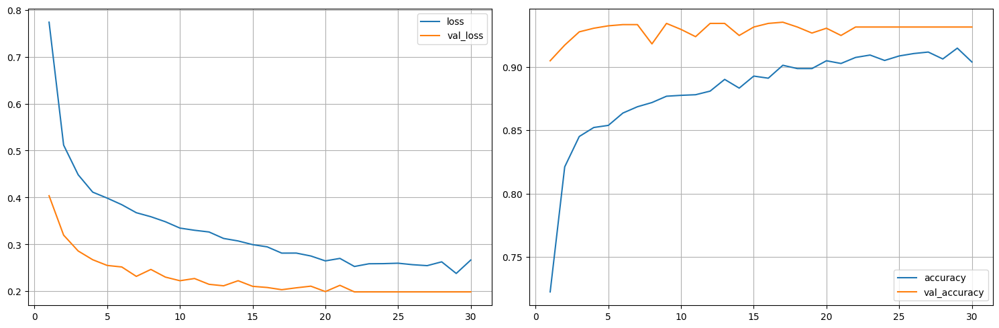

264/264 - 170s - loss: 0.2665 - accuracy: 0.9039 - val_loss: 0.1986 - val_accuracy: 0.9315 - lr: 1.0000e-13 - 170s/epoch - 644ms/step


In [20]:
model = train_clf(train_datagen_flow, val_datagen_flow) # training the model

Thus, our best result on validation image set is about 93% accuracy and 20% logloss. Not an ideal but pretty good result. Other breed class as well as significant aspect differences within the same breed as well as the number of available images might have influenced the metrics.

## Model Testing and Results Overview

In [21]:
# creating a generator for test images with a batch size of 1 and the same preoprocessing as for the train and validation images
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
test_datagen_flow= test_datagen.flow_from_directory(
    'test',
    target_size=(299, 299),
    batch_size=1,
    class_mode="sparse")

Found 431 images belonging to 4 classes.


In [22]:
# checking our model performance on the test images
test_loss, test_acc = model.evaluate(test_datagen_flow, verbose = 2)

431/431 - 17s - loss: 0.2593 - accuracy: 0.9118 - 17s/epoch - 40ms/step


Let's find out when our model performs the worst.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 0 vs real breed 1


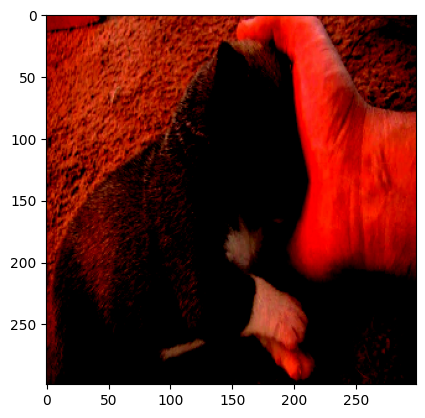

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 0 vs real breed 3


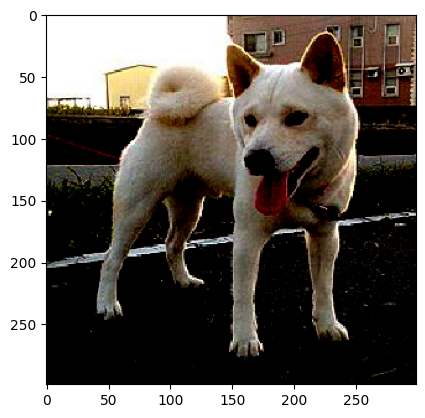

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 3 vs real breed 2


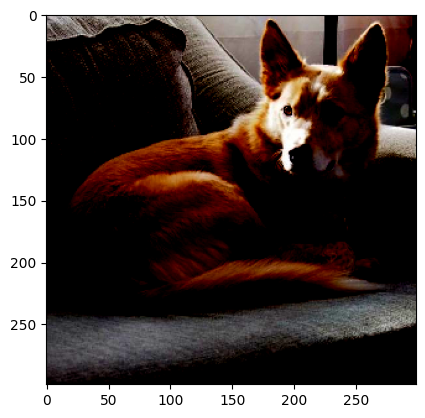

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 3 vs real breed 2


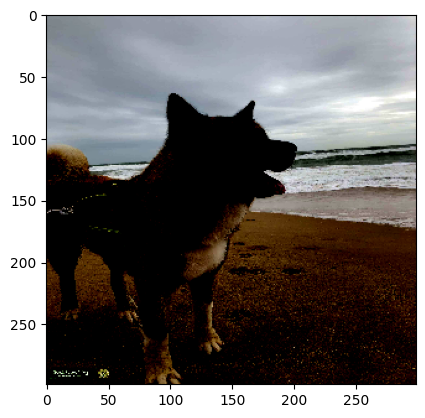

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 3 vs real breed 0


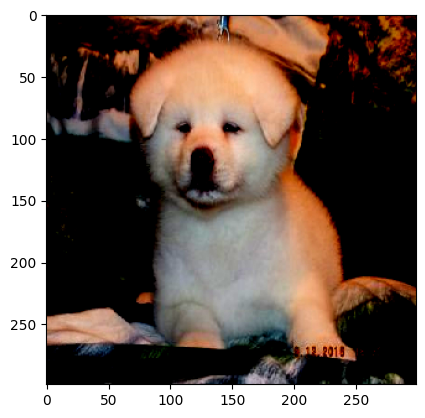

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 2 vs real breed 3


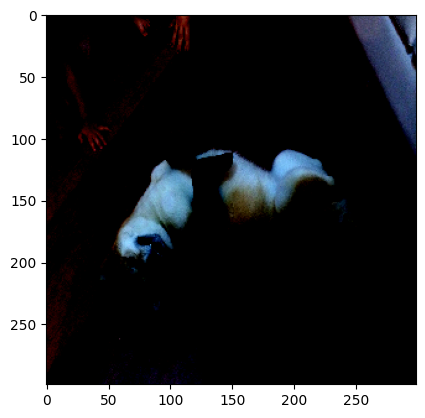

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 2 vs real breed 1


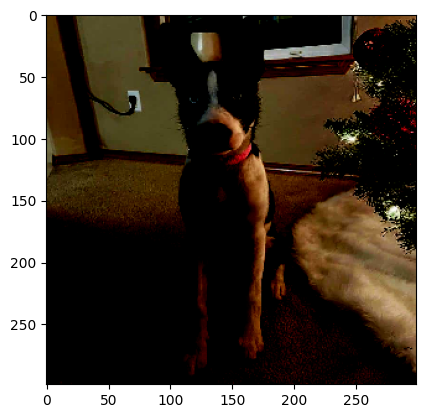

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 1 vs real breed 2


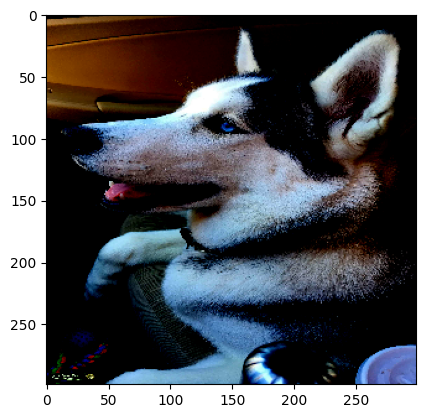

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 2 vs real breed 0


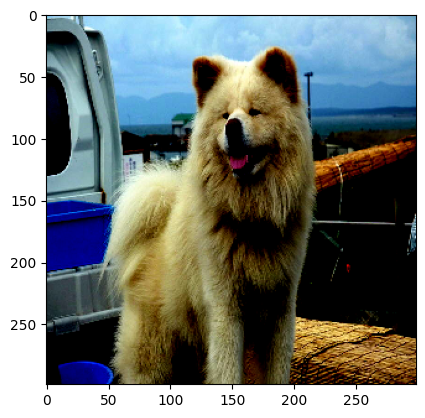

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 0 vs real breed 3


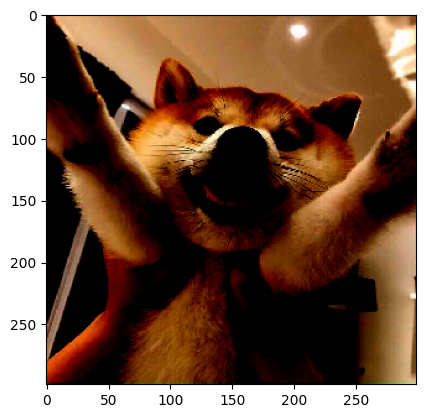

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 2 vs real breed 0


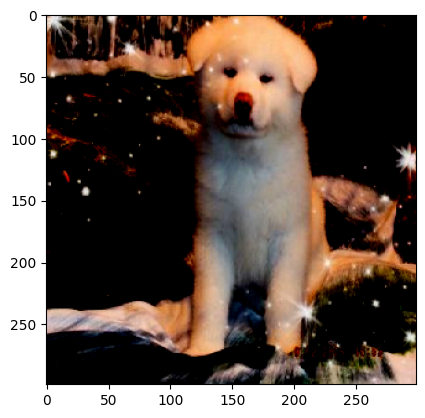

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 0 vs real breed 3


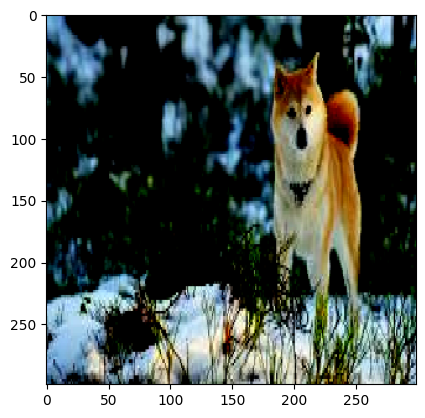

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 0 vs real breed 3


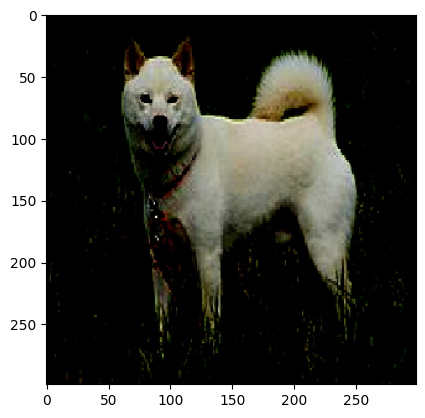

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 3 vs real breed 0


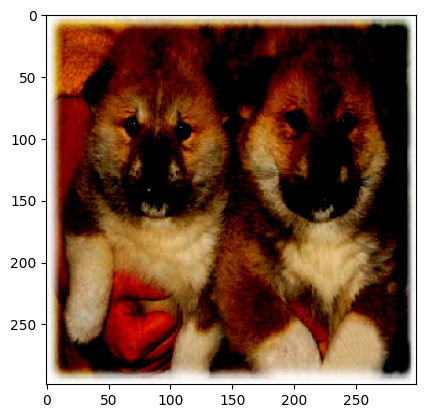

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 3 vs real breed 0


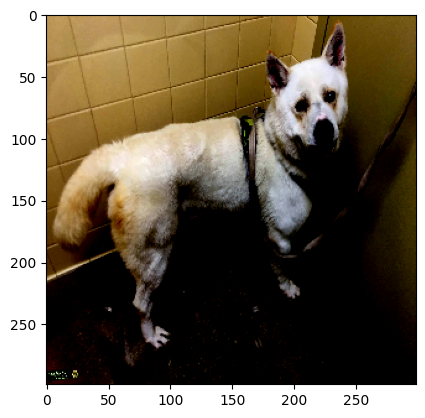

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 3 vs real breed 0


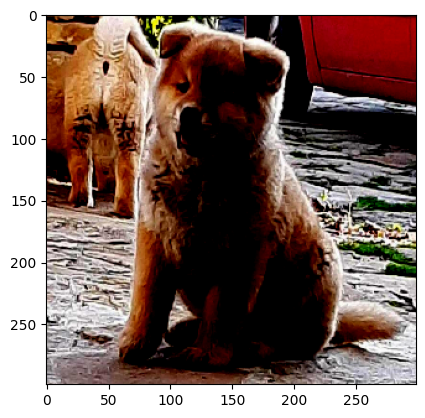

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 3 vs real breed 0


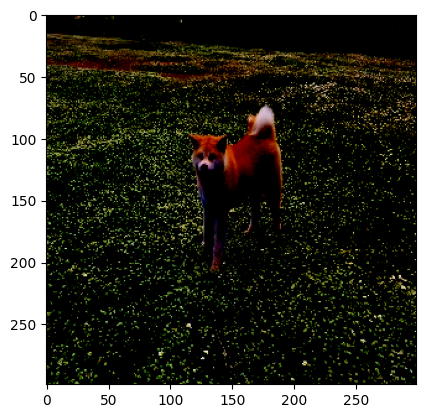

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 3 vs real breed 2


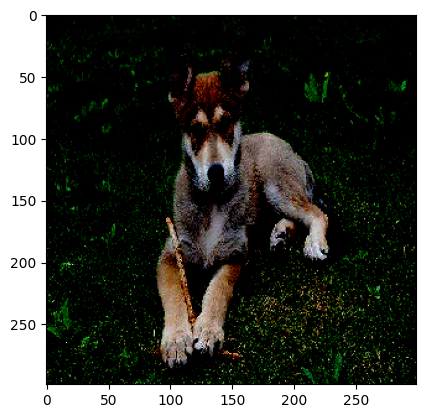

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 1 vs real breed 3


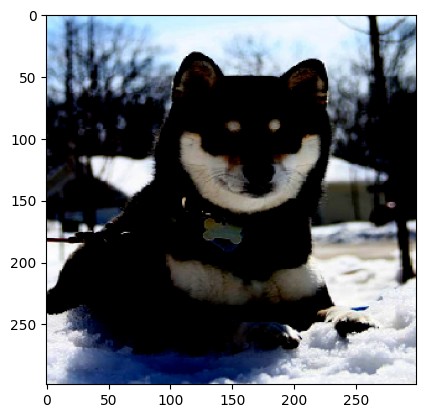

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 3 vs real breed 0


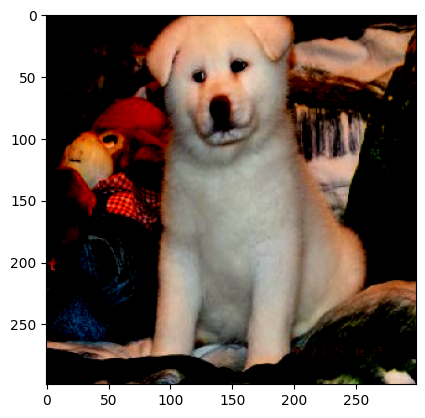

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 0 vs real breed 1


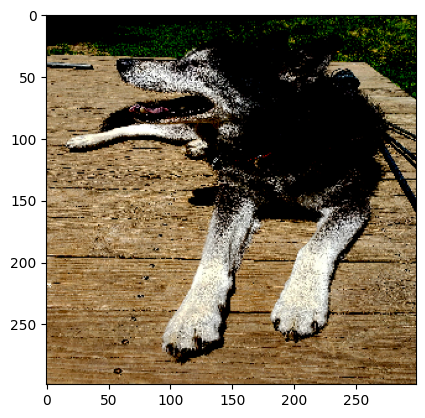

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 3 vs real breed 0


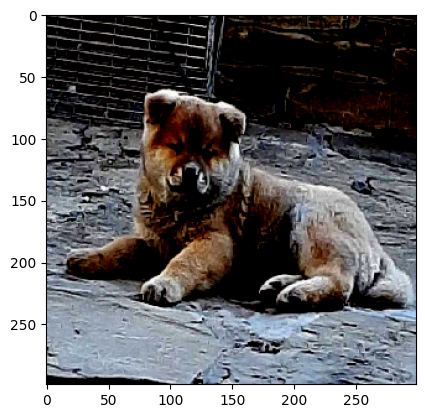

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 3 vs real breed 0


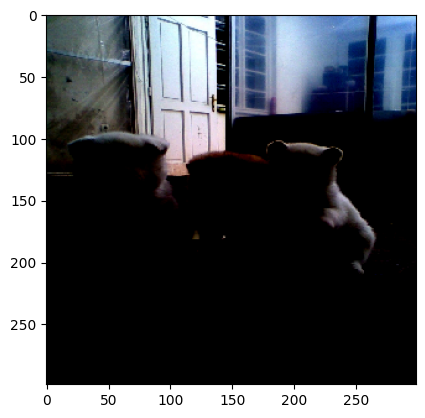

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 0 vs real breed 3


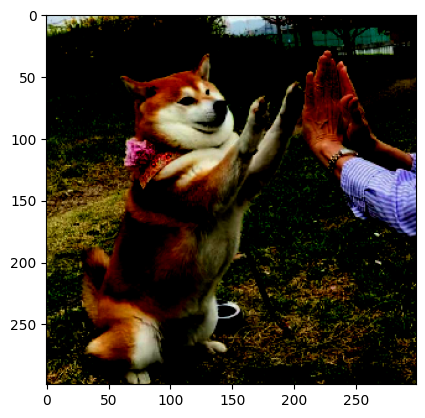

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 3 vs real breed 0


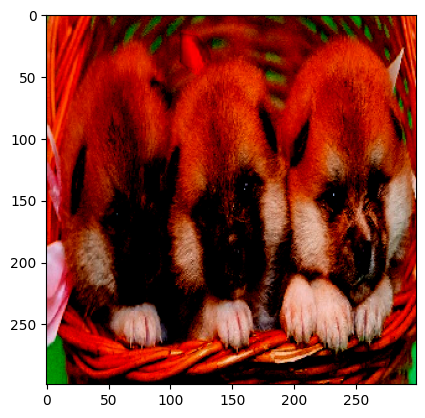

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 3 vs real breed 0


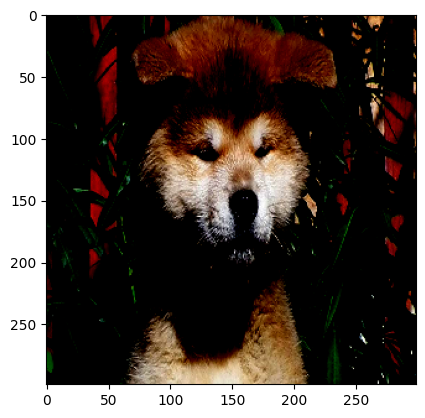

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 0 vs real breed 3


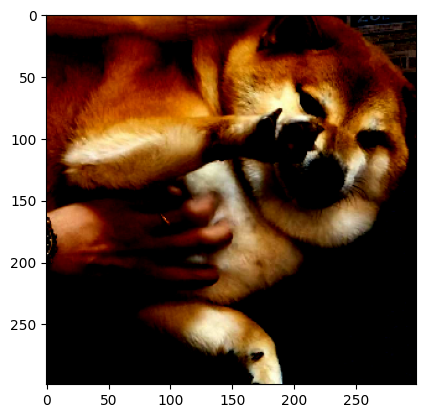

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 3 vs real breed 2


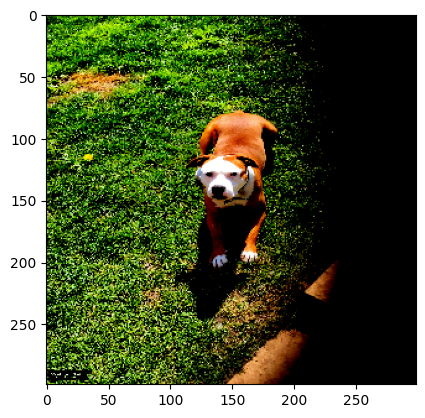

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 3 vs real breed 0


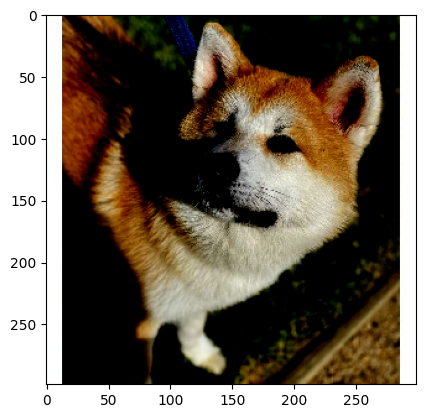

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 3 vs real breed 2


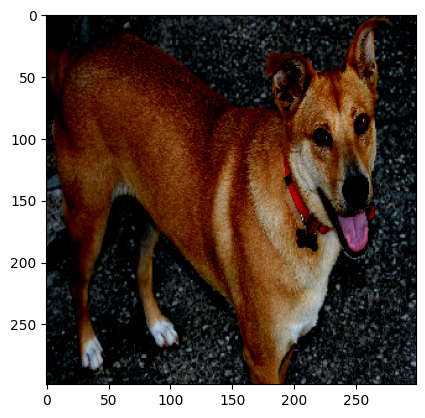

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 3 vs real breed 0


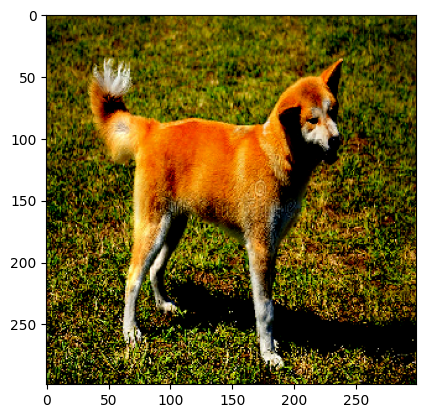

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 0 vs real breed 3


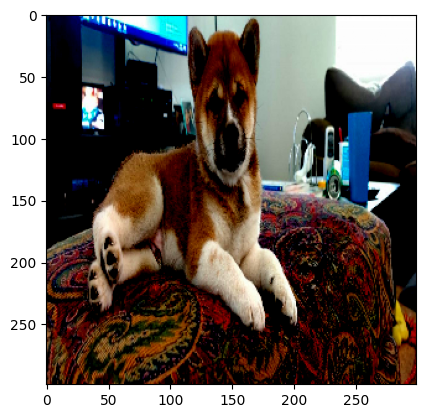

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 0 vs real breed 3


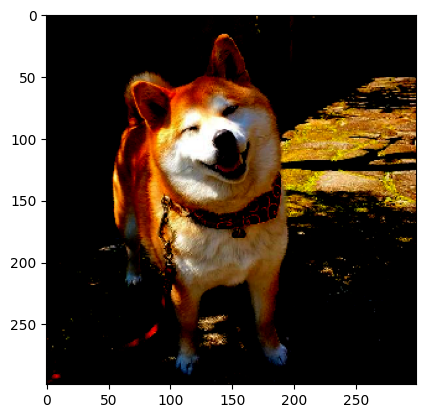

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 3 vs real breed 0


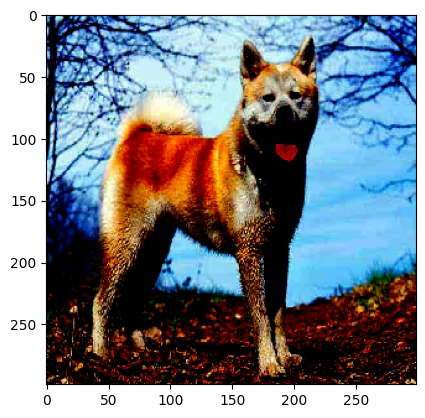

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 3 vs real breed 0


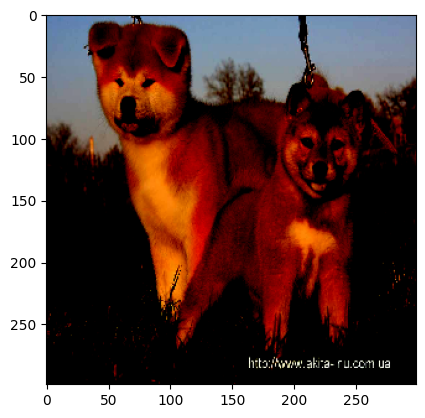

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 1 vs real breed 3


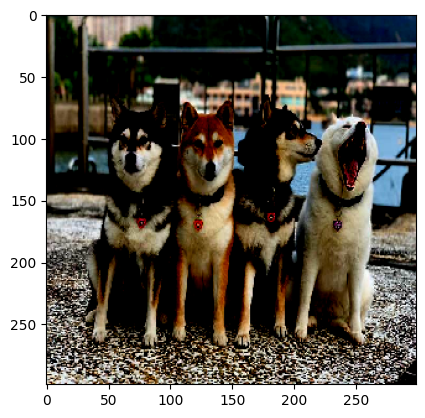

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 3 vs real breed 0


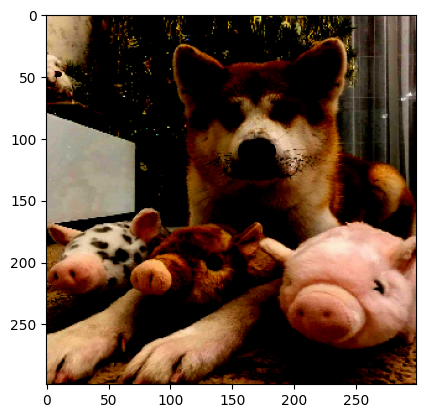

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


prediction 2 vs real breed 0


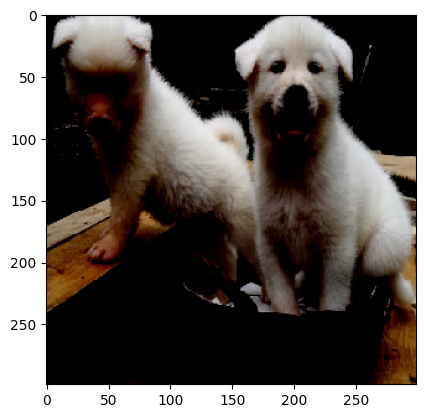

In [23]:
labels =[] # creating a list to fill in with the real labels
predictions = [] # creating a list to fill in with the predictions

# iterating over test generating and printing those images on which our model made an incorrect prediction
for batch in range(len(test_datagen_flow)):
    image, label = test_datagen_flow.next()
    probs = model.predict(image)
    prediction = np.argmax(probs, axis = 1)
    labels.append(label)
    predictions.append(prediction)
    if prediction[0]!=int(label[0]):
        print(f'prediction {prediction[0]} vs real breed {int(label[0])}')
        reshaped = np.squeeze(image)
        plt.imshow(reshaped)
        plt.show()

Our model made correct prediction on 394 out of 432 images, test accuracy is 2% lower compared to the validation image set. The images above let us deduce that the model makes mistakes mostly on untypical coat puppies.

In [35]:
# definign a function to plot a confusion matrix of the overall performance on the test
def cm(target, pred):
    confmx = confusion_matrix(target, pred)
    f, ax = plt.subplots(figsize = (8,8))
    sns.heatmap(confmx, annot=True, fmt='.1f', ax = ax)
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    plt.show()
    return f

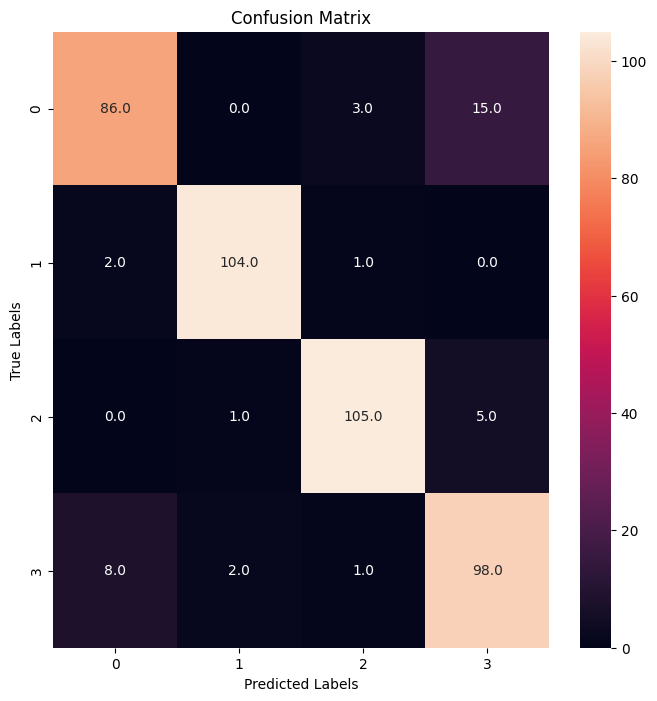

In [36]:
fig = cm(labels, predictions) # plotting the confusion matrix

The confusion matrix gives us even more details. We clearly see that the model confuses mostly Akita inu and Shiba inu - actually, they look quite alike even from human point of view. A typical Siberian husky looks more different due to the coat colors.

Let's test our model on additional single images.

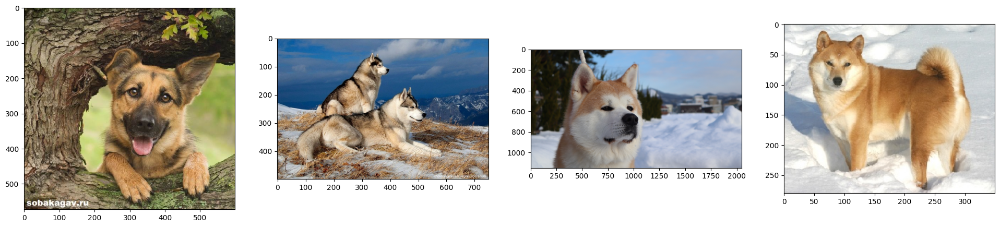

In [37]:
# loading some more random images of each class
test_images = ['test_1.jpeg', 'test_2.jpeg', 'test_3.jpeg', 'test_4.jpeg']
fig = plt.figure(figsize=(24, 16))
for idx, im in enumerate(test_images):
    plt.subplot(1,4, idx+1)
    im = cv2.imread(im)
    plt.imshow(im[...,::-1])
plt.show()

In [38]:
# defining a gunction to load a single image and properly preprocess it
def load_image(filename):
    try:
        img = load_img(filename, target_size = (299, 299))
        img = tf.convert_to_tensor(img, dtype=tf.float32)
        img = np.expand_dims(img, axis = 0)
        img = preprocess_input(img)
        return img
    except:
        return 'Your file extension is not supported or too small. Please load a jpeg, jpg or png file of at least 10 kb.'

In [39]:
# defining a function to make a prediction on a single image
def predict(image, clf=model):
    test_image = load_image(image)
    probs = clf.predict(test_image)
    cls = np.argmax(probs, axis = 1)
    if cls[0]==0:
        return 'Akita inu'
    elif cls[0]==1:
        return 'Siberian husky'
    elif cls[0]==2:
        return 'Other breed'
    else:
        return 'Shiba inu'

In [40]:
# making prediction on the single images
for im in test_images:
    print(im, predict(im))

test_1.jpeg Other breed
test_2.jpeg Siberian husky
test_3.jpeg Akita inu
test_4.jpeg Shiba inu


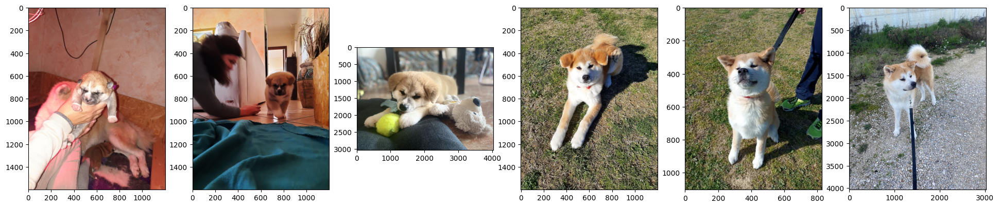

In [41]:
# loading more single images of my dog at various stages of its life
saigo = ['saigo_0.jpg', 'saigo_1.jpeg', 'saigo_2.jpeg', 'saigo_3.jpeg', 'saigo_4.PNG', 'saigo_5.JPG']
fig = plt.figure(figsize=(24, 16))
for idx, im in enumerate(saigo):
    plt.subplot(1,6, idx+1)
    im = cv2.imread(im)
    plt.imshow(im[...,::-1])
plt.show()

In [42]:
# making predictions on the images of Saigo
for im in saigo:
    print(im, predict(im))

saigo_0.jpg Akita inu
saigo_1.jpeg Akita inu
saigo_2.jpeg Akita inu
saigo_3.jpeg Akita inu
saigo_4.PNG Akita inu
saigo_5.JPG Akita inu


Fortunately, our model managed to predict correctly the breed of my dog at its very different ages -  from few days to its actual aspect. I wish people were using it instead of asking me 'weird'questions 😏.

Finally, we will save the model to buid an web application in the nearest future.

In [45]:
model.save('final_model.h5')

INFO:tensorflow:Assets written to: pet_model\assets
